In [1]:
import os

import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import hvplot.pandas  # noqa

import xarray as xr


import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Polygon

%matplotlib inline
from matplotlib import pyplot as plt
import hvplot.pandas
import holoviews as hv
#
#import pynsitu as pin
#from pynsitu.maps import crs
#import taos.sensors as se

In [2]:
def read_carthe_drifters(file):
    
    df = pd.read_csv(file, parse_dates=[1])
    
    df = (df
          .rename(columns=dict(DeviceName="id", DeviceDateTime="time", 
                               Latitude="latitude", Longitude="longitude"))
          .sort_values("id")
         )
    df = df.set_index("id")
        
    return df

---

## Load drifters trajectories

`drifters_bin.csv` is a binary csv file and it was converted into an ascii csv file with:

```
cat drifters_bin.csv | tr -d '\0' > drifters.csv
```



In [4]:
drifter_file = os.path.join('/Users/mdemol/code/PhD/carthe_noise', "carthe_noise_ok.csv")
df = read_carthe_drifters(drifter_file).reset_index().set_index('time').sort_values('time')
df.head()

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude
time,,,,,,,,
2023-03-07 10:10:14,0-4351906,GOOD,0-4351906,0,0,3,48.357964,-4.560463
2023-03-07 10:11:03,0-4388557,GOOD,0-4388557,0,0,3,48.357943,-4.560592
2023-03-07 10:11:18,0-4351902,GOOD,0-4351902,0,0,3,48.357922,-4.560485
2023-03-07 10:11:41,0-4367307,GOOD,0-4367307,0,0,3,48.357911,-4.560463
2023-03-07 10:11:42,0-4367707,GOOD,0-4367707,0,0,3,48.357922,-4.560378


In [8]:
ids = list(df.id.unique())

print("drifter id's in data file:")
print(ids, len(ids))

drifter id's in data file:
['0-4351906', '0-4388557', '0-4351902', '0-4367307', '0-4367707', '0-4356534', '0-4367310', '0-4367706', '0-4367683', '0-4351945', '0-4356456', '0-4351296', '0-4388554', '0-4388581', '0-4388675', '0-4388605', '0-4388627', '0-4388608', '0-4388635', '0-4388620', '0-4388599'] 21


## Removing outliers 0.0 values 
0.0 values on some trajectories when gps quality =1 

In [5]:
df = df[df.GpsQuality!=1]

_____
## Filtering outliers

---

## Add dt and dlon dlat distance to mean value

In [7]:
def compute_dt(df) : 
    df = df.copy()
    t = df.index.to_series()
    dt = t.diff()/ pd.Timedelta("1s")
    dt.index = df.index
    df.loc[:, "dt"] = dt
    return df
def compute_dlonlat(df):
    df = df.copy()
    lonm = df.longitude.mean()
    latm = df.latitude.mean()
    df.loc[:, "dlon"] = df.longitude - lonm
    df.loc[:, "dlat"] = df.latitude - latm
    return df
df = df.groupby('id').apply(compute_dt)
df = df.groupby('id').apply(compute_dlonlat)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_25813/1964030574.py:15: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('id').apply(compute_dt)
/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_25813/1964030574.py:16: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)


In [202]:
df[df.id==ids[0]]

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude,dt,dlon,dlat
time,,,,,,,,,,,
2023-03-07 10:10:14,0-4351906,GOOD,0-4351906,0,0,3,48.357964,-4.560463,NaN,-0.000022,0.000051
2023-03-07 10:14:43,0-4351906,GOOD,0-4351906,0,0,3,48.357943,-4.560463,269.0,-0.000022,0.000030
2023-03-07 10:19:41,0-4351906,GOOD,0-4351906,0,0,3,48.358007,-4.560463,298.0,-0.000022,0.000094
2023-03-07 10:24:40,0-4351906,GOOD,0-4351906,0,0,3,48.357997,-4.560442,299.0,-0.000001,0.000084
2023-03-07 10:29:40,0-4351906,GOOD,0-4351906,0,0,3,48.357986,-4.560442,300.0,-0.000001,0.000073
...,...,...,...,...,...,...,...,...,...,...,...
2023-03-08 07:34:44,0-4351906,GOOD,0-4351906,0,0,3,48.357911,-4.560270,300.0,0.000171,-0.000002
2023-03-08 07:39:44,0-4351906,GOOD,0-4351906,0,0,3,48.357964,-4.560249,300.0,0.000192,0.000051
2023-03-08 07:44:44,0-4351906,GOOD,0-4351906,0,0,3,48.357975,-4.560249,300.0,0.000192,0.000062


_____
## Filtering outliers

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_25813/952380763.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(15,7))


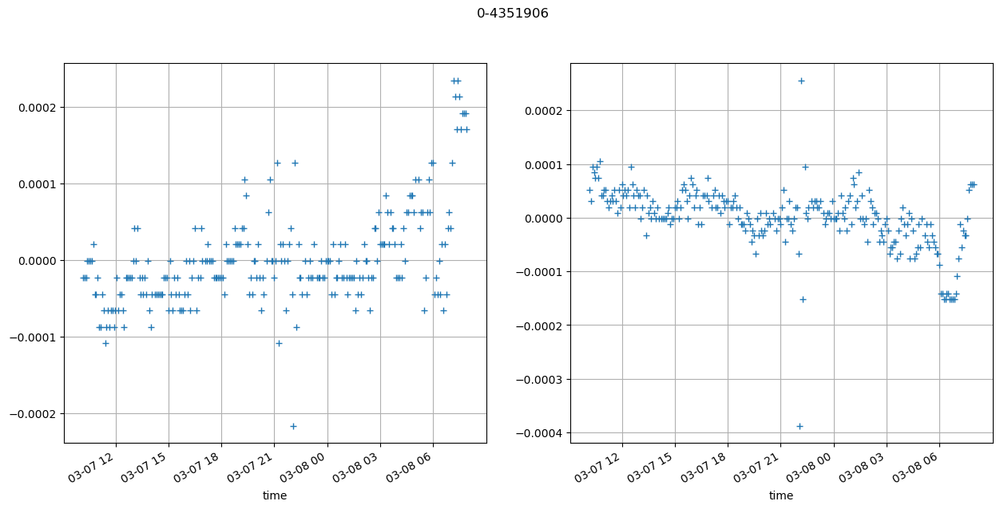

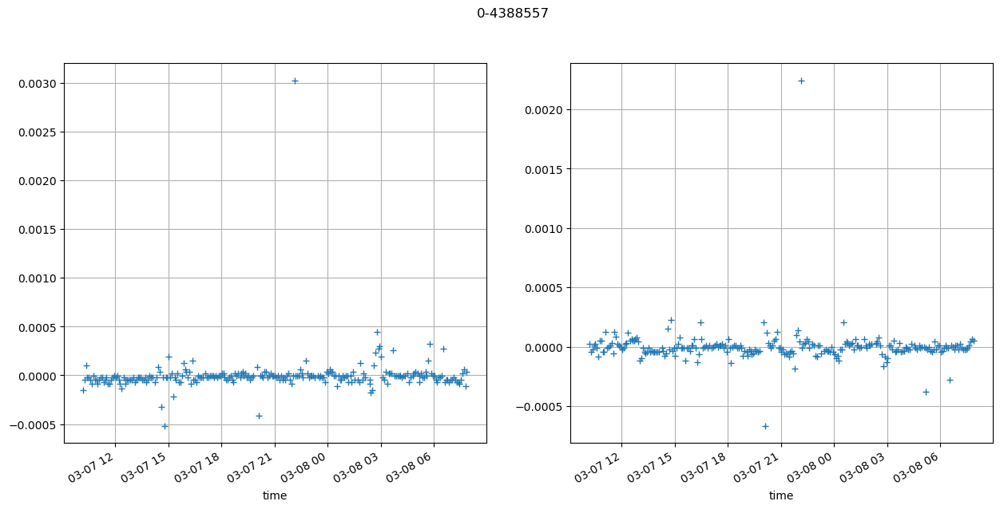

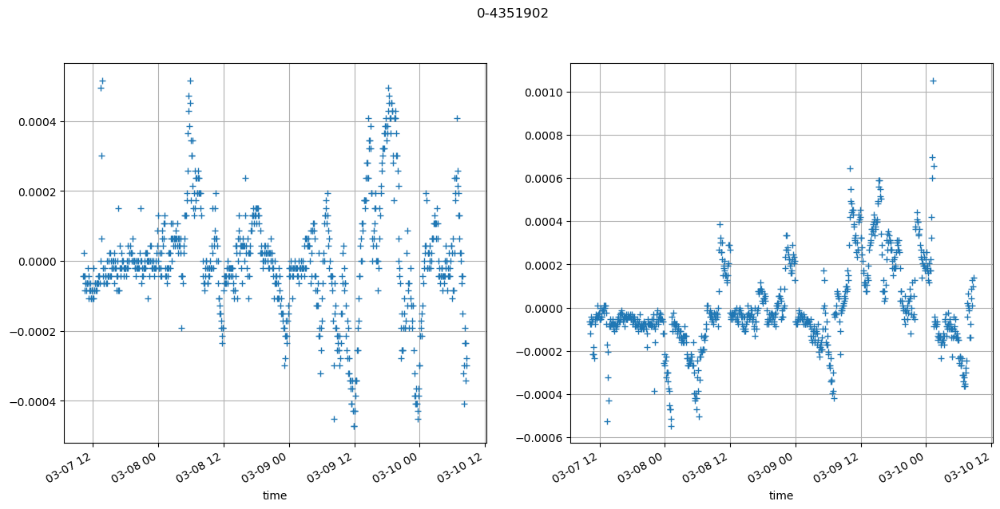

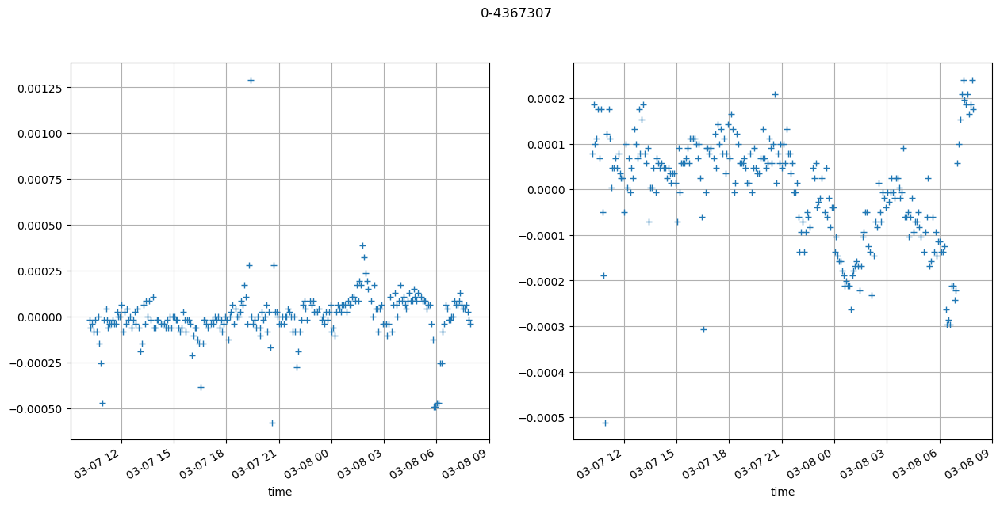

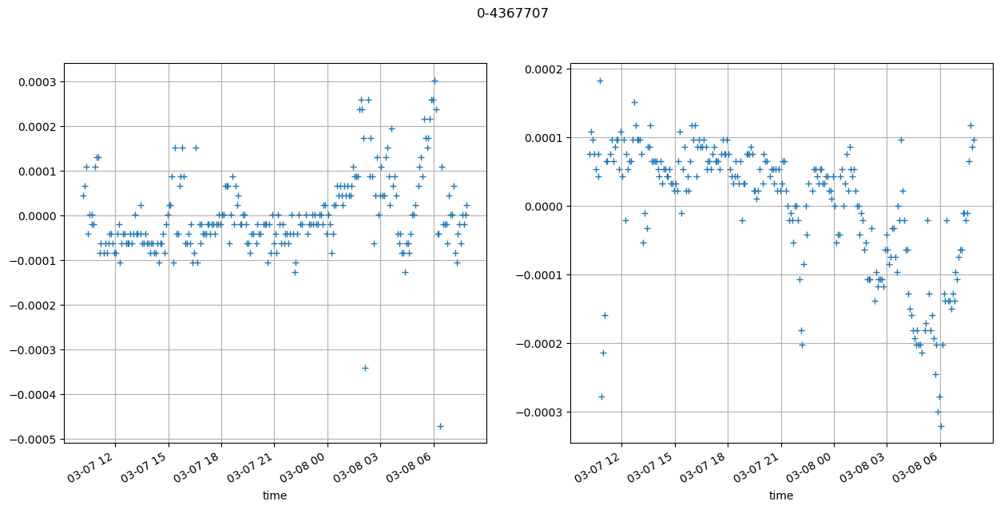

...

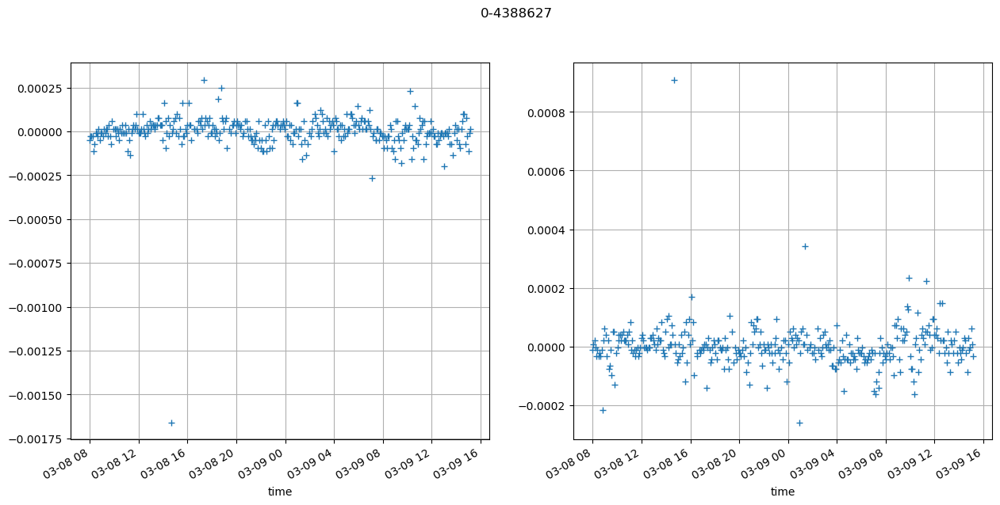

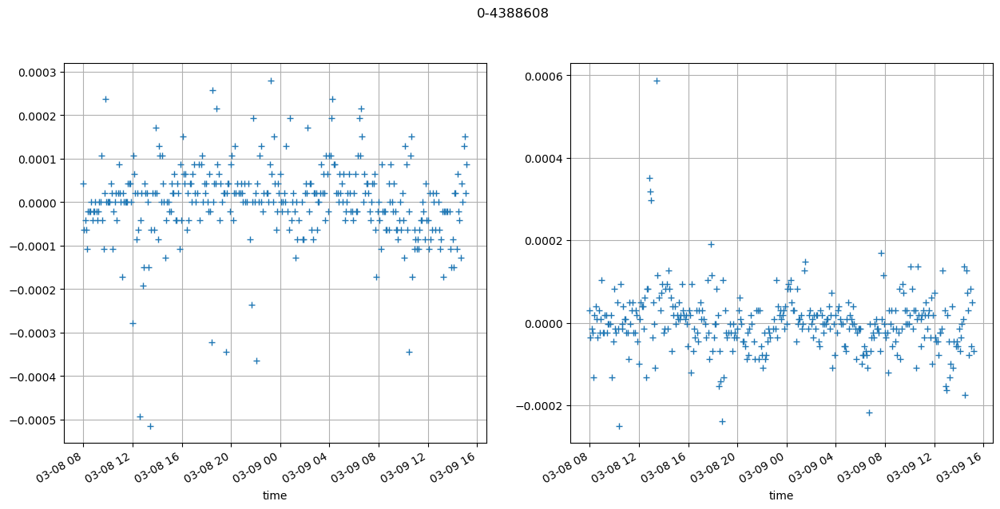

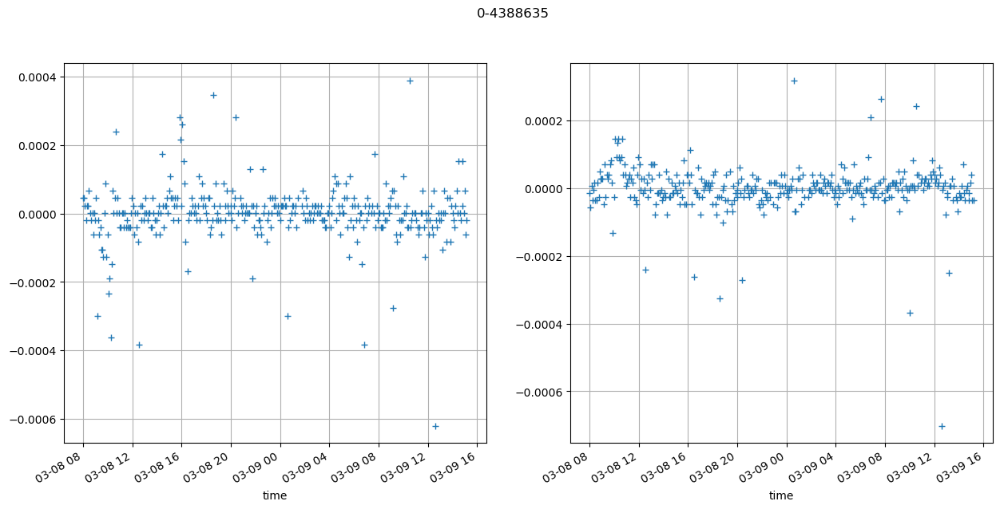

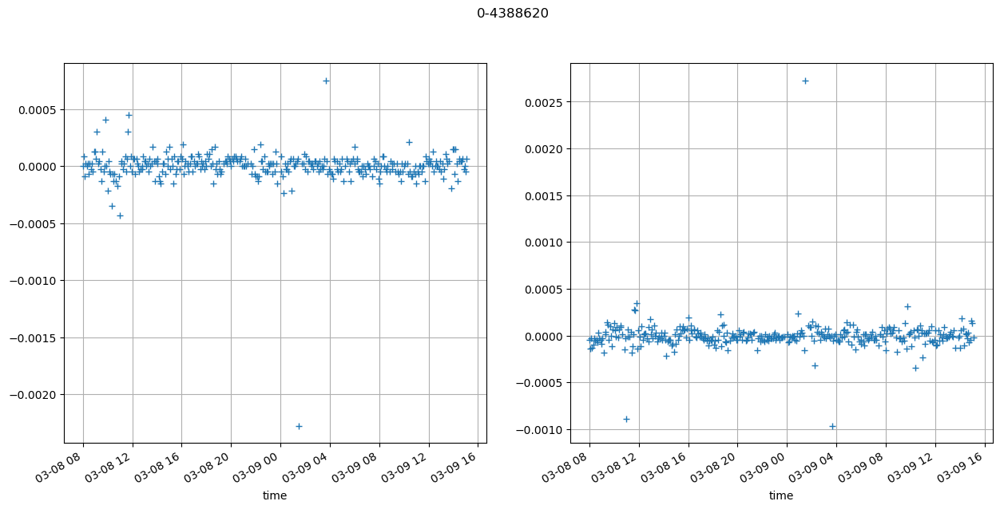

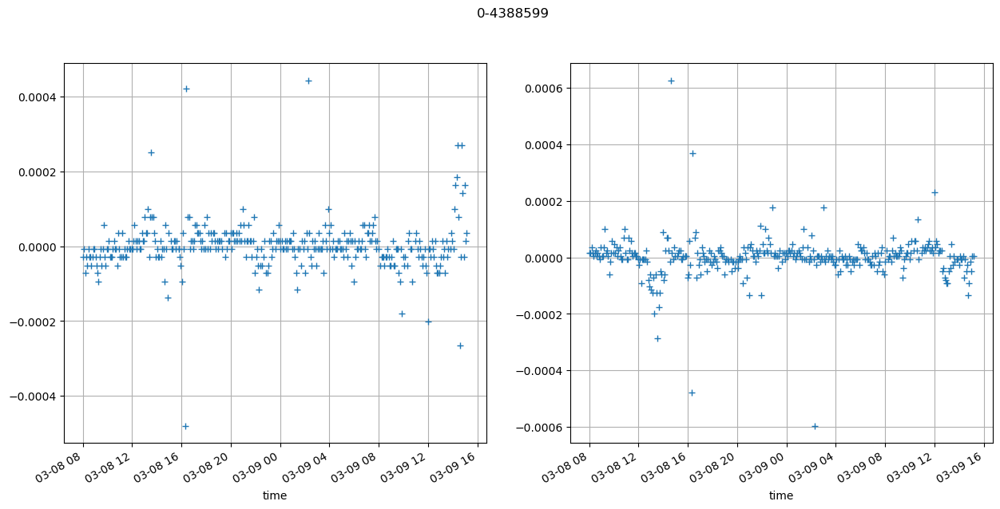

In [9]:
for id_ in ids:
    fig, ax = plt.subplots(1, 2, figsize=(15,7))
    df_=df[df.id==id_]
    df_.dlon.plot(ls='', marker='+', ax=ax[0])
    df_.dlat.plot(ls='', marker='+', ax=ax[1])
    #ax[0].axhline(df_.longitude.mean(), color = 'r')
    #ax[1].axhline(df_.latitude.mean(), color ='r')
    for a in ax :
        a.grid()
    fig.suptitle(id_)

In [62]:
id_=ids[0]
#id_
df[df.id==id_]

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude
time,,,,,,,,
2023-03-10 08:44:45,0-4351296,GOOD,0-4351296,0,0,3,48.357879,-4.560442
2023-03-08 00:47:34,0-4351296,GOOD,0-4351296,0,0,3,48.357707,-4.560463
2023-03-09 09:34:50,0-4351296,GOOD,0-4351296,0,0,3,48.357814,-4.560142
2023-03-08 00:52:39,0-4351296,GOOD,0-4351296,0,0,3,48.357750,-4.560549
2023-03-08 00:57:41,0-4351296,GOOD,0-4351296,0,0,3,48.357825,-4.560420
...,...,...,...,...,...,...,...,...
2023-03-09 20:04:46,0-4351296,GOOD,0-4351296,0,0,3,48.357889,-4.560528
2023-03-07 13:27:38,0-4351296,GOOD,0-4351296,0,0,3,48.357782,-4.560399
2023-03-10 08:24:48,0-4351296,GOOD,0-4351296,0,0,3,48.357932,-4.560463


<AxesSubplot: xlabel='longitude', ylabel='latitude'>

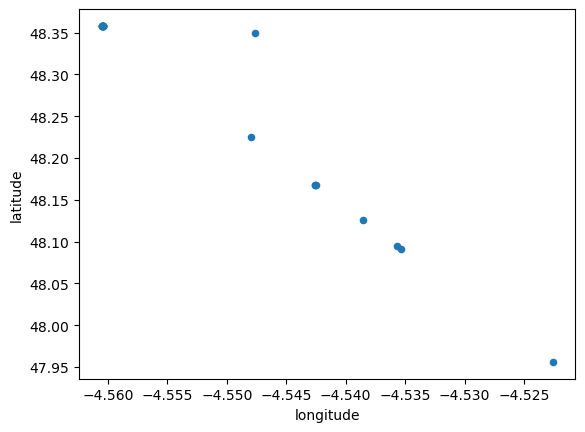

In [127]:
df_mean = df[['latitude','longitude','id']].groupby('id').mean()
df_mean.plot.scatter('longitude', 'latitude')

<AxesSubplot: xlabel='longitude', ylabel='latitude'>

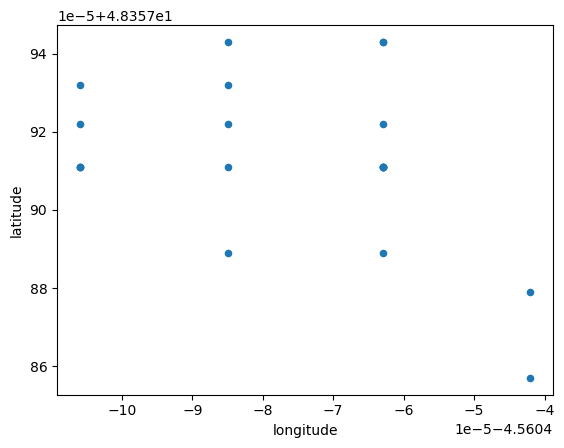

In [128]:
df_median = df[['latitude','longitude','id']].groupby('id').median()
df_median.plot.scatter('longitude', 'latitude')

In [131]:
df_median

,latitude,longitude
id,,
0-4351296,48.357911,-4.560463
0-4351902,48.357943,-4.560463
0-4351906,48.357922,-4.560463
0-4351945,48.357911,-4.560463
0-4356456,48.357911,-4.560463
0-4356534,48.357911,-4.560463
0-4367307,48.357857,-4.560442
0-4367310,48.357889,-4.560485
0-4367683,48.357932,-4.560485


In [103]:
print(df.longitude.median(), df.latitude.median())

-4.560485 48.357922


In [110]:
def geo_plot(df, list_id, title="", legend="", **kwargs):
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.EckertIII(central_longitude=-180))
    #ax.add_feature(cfeature.LAND, zorder=2)
    
    lat_min, lat_max = df[df.longitude!=0].longitude.min(), df[df.longitude!=0].longitude.max()
    lon_min, lon_max = df[df.latitude!=0].latitude.min(), df[df.latitude!=0].latitude.max()
    for id_ in list_id:
        df_ = (
            df[df.id==id_][["longitude", "latitude"]]
        )
        lon = np.array(df_.longitude)
        lat = np.array(df_.latitude)
        ax.scatter(
            lon, lat, marker=".", s=3, transform=ccrs.PlateCarree(), label=str(id_)
        )
    lat_med = df.latitude.median()
    lon_med = df.longitude.median()  
    lon_ex = 1e-3
    lat_ex = 1e-3
    ax.set_extent(np.array([lon_med-lon_ex, lon_med+lon_ex, lat_med-3*lat_ex, lat_med+lat_ex])+1e-3, ccrs.PlateCarree())
    ax.set_title(title, fontsize=15)
    gl = ax.gridlines(
        draw_labels=True,
    )
    print([lon_min, lon_max, lat_min, lat_max])
    fig.legend()

In [121]:
i=4
df_ = df[df.id==id_]
hvplot = (df[df.id==ids[i+0]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+0])
          * df[df.id==ids[i+1]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+1])
          * df[df.id==ids[i+2]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+2])
          * df[df.id==ids[i+3]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+3])
          * df[df.id==ids[i+4]]["longitude"].hvplot(grid=True, kind="scatter",label=ids[i+4])
          + df[df.id==ids[i+0]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+0])
          * df[df.id==ids[i+1]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+1])
          * df[df.id==ids[i+2]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+2])
          * df[df.id==ids[i+3]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+3])
          * df[df.id==ids[i+4]]["latitude"].hvplot(grid=True, kind="scatter",label=ids[i+4]))
layout = hv.Layout(hvplot).cols(1)
layout

:Layout
   .Overlay.I  :Overlay
      .Scatter.A_0_hyphen_minus_4356456 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4356534 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4367307 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4367310 :Scatter   [time]   (longitude)
      .Scatter.A_0_hyphen_minus_4367683 :Scatter   [time]   (longitude)
   .Overlay.II :Overlay
      .Scatter.A_0_hyphen_minus_4356456 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4356534 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4367307 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4367310 :Scatter   [time]   (latitude)
      .Scatter.A_0_hyphen_minus_4367683 :Scatter   [time]   (latitude)

In [117]:
df.hvplot?

Type:        property
String form: <property object at 0x168da3130>
Docstring:   <no docstring>


[45.398147, 48.360657, -4.562781, -0.086088]


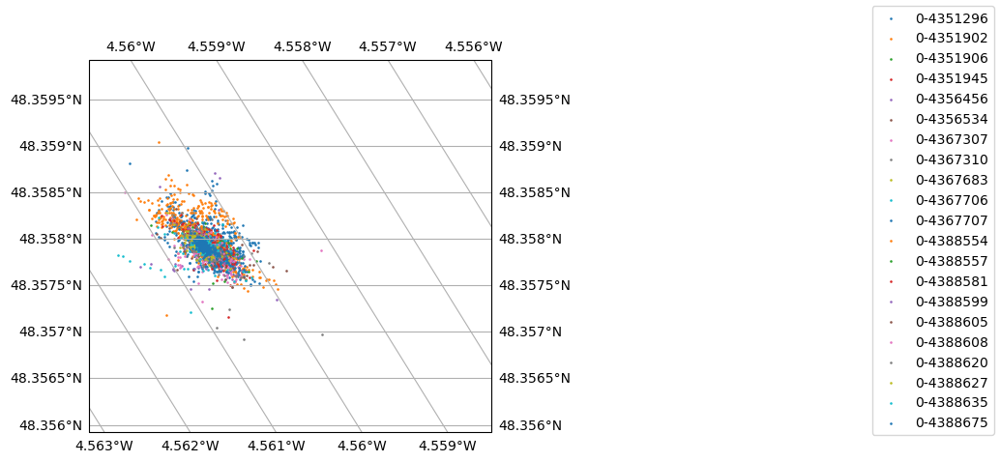

In [111]:
geo_plot(df, ids)

---

## Histograms

In [260]:
df.sort_values('dlon', ascending=False)

,id,BatteryStatus,CommId,GPS Confidence,GPS Fail Counter,GpsQuality,latitude,longitude,dt,dlon,dlat
time,,,,,,,,,,,
2023-03-08 15:28:49,0-4388605,GOOD,0-4388605,0,0,3,45.398147,-0.086088,297.0,4.461552,-2.951260
2023-03-07 22:07:12,0-4388557,GOOD,0-4388557,0,0,3,48.360164,-4.557416,304.0,0.003023,0.002242
2023-03-07 19:22:06,0-4367307,GOOD,0-4367307,0,0,3,48.357879,-4.559154,329.0,0.001291,0.000047
2023-03-09 03:39:24,0-4388620,GOOD,0-4388620,0,0,3,48.356967,-4.559755,277.0,0.000749,-0.000965
2023-03-07 10:13:11,0-4356456,GOOD,0-4356456,0,0,3,48.358651,-4.559820,NaN,0.000645,0.000758
...,...,...,...,...,...,...,...,...,...,...,...
2023-03-08 17:09:15,0-4388605,GOOD,0-4388605,0,0,3,48.358007,-4.560935,604.0,-0.013295,0.008600
2023-03-08 17:14:46,0-4388605,GOOD,0-4388605,0,0,3,48.358050,-4.560957,331.0,-0.013317,0.008643
2023-03-08 23:45:47,0-4388605,GOOD,0-4388605,0,0,3,48.357664,-4.560978,357.0,-0.013338,0.008257


In [261]:
df.dlon.quantile(0.9999)

1.1836418252301935

In [ ]:
df[df.dlon <df.dlon.quantile(0.9999)

On trajectory of 

In [211]:
print(abs(df.dlon).max(), abs(df.dlat).max())
print(abs(df.dlon).min(), abs(df.dlat).min())
print(abs(df.dlon).quantile(0.999), abs(df.dlat).quantile(0.999))

4.461552028735633 2.951259913793109
6.288088645334255e-07 1.9841266407638614e-08
0.013108835264367047 0.008664470206889326


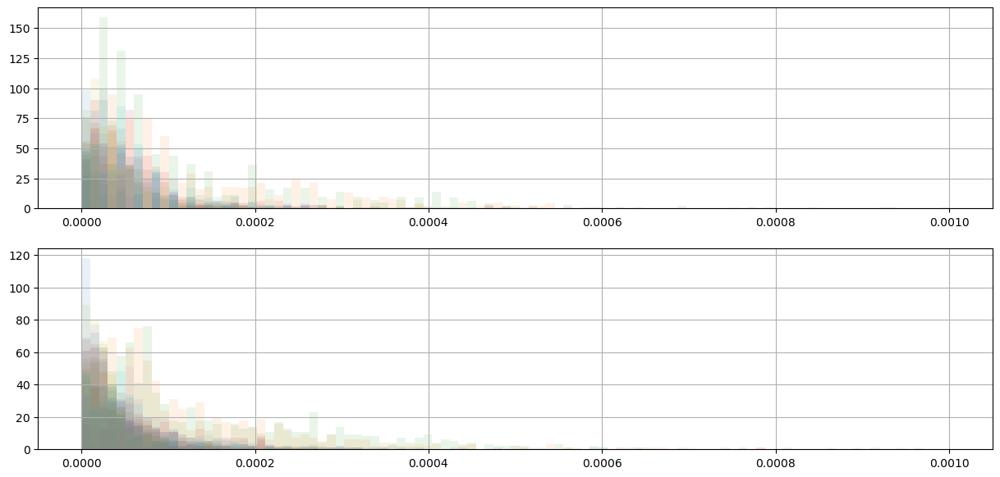

In [216]:
bins = np.linspace(0, 0.001, 100)
fig, ax = plt.subplots(2, 1, figsize=(15,7))
for id_ in ids :
    df_ = df[df.id==id_]
    abs(df_.dlon).hist(ax=ax[0], label = id_, alpha=0.1, bins=bins)
    abs(df_.dlat).hist(ax=ax[1], label = id_, alpha=0.1, bins=bins)

In [251]:
print(df.longitude.max(), df.latitude.max())
print(df.longitude.min(), df.latitude.min())
print(df.longitude.quantile(0.001),df.longitude.quantile(0.999))
print(df.latitude.quantile(0.005),df.latitude.quantile(0.995))

-0.086088 48.360657
-4.562781 45.398147
-4.561363472 -4.559841
48.357546 48.35845228


(48.357546, 48.35845228)

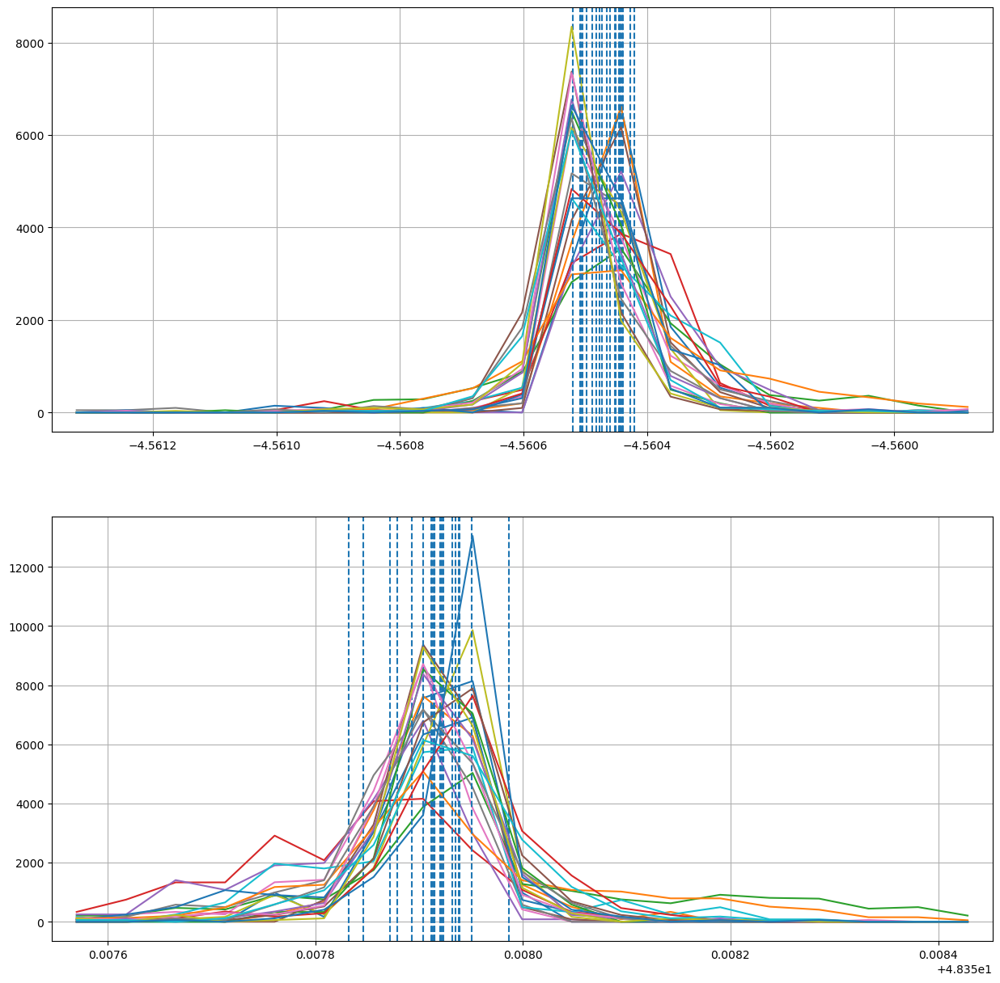

In [257]:
bins_lon = np.linspace(-4.561363472,-4.559841, 20)
bins_lat = np.linspace(48.357546, 48.35845228,  20)
fig, ax = plt.subplots(2, 1, figsize=(15,15))
for id_ in ids :
    #fig, ax = plt.subplots(2, 1, figsize=(15,7))
    df_ = df[df.id==id_]
    hist_lon = np.histogram(df_.longitude, bins_lon, density=True)
    hist_lat = np.histogram(df_.latitude, bins_lat, density=True)
    ax[0].plot(bins_lon[:-1] + np.diff(bins_lon)/2, hist_lon[0], label = id_)
    ax[1].plot(bins_lat[:-1] + np.diff(bins_lat)/2, hist_lat[0], label = id_)
    ax[0].axvline(df_.longitude.mean(), ls='--')
    ax[1].axvline(df_.latitude.mean(), ls='--')
for a in ax :
    a.grid()
ax[0].set_xlim(-4.561363472,-4.559841)
ax[1].set_xlim(48.357546, 48.35845228)
    #df_.longitude.hist(ax=ax[0], label = id_, alpha=0.2, bins=bins_lon, density=False)
    #df_.latitude.hist(ax=ax[1], label = id_, alpha=0.2, bins=bins_lat, density=False)

---

## xarray

In [ ]:
ds = df.reset_index().set_index(['id', 'time']).to_xarray().rename({'id':'id_'})

In [22]:
ds

<xarray.Dataset>
Dimensions:           (id_: 21, time: 7189)
Coordinates:
  * id_               (id_) object '0-4351296' '0-4351902' ... '0-4388675'
  * time              (time) datetime64[ns] 2023-03-07T10:10:14 ... 2023-03-1...
Data variables:
    BatteryStatus     (id_, time) object nan nan nan nan nan ... nan nan nan nan
    CommId            (id_, time) object nan nan nan nan nan ... nan nan nan nan
    GPS Confidence    (id_, time) float64 nan nan nan nan ... nan nan nan nan
    GPS Fail Counter  (id_, time) float64 nan nan nan nan ... nan nan nan nan
    GpsQuality        (id_, time) float64 nan nan nan nan ... nan nan nan nan
    latitude          (id_, time) float64 nan nan nan nan ... nan nan nan nan
    longitude         (id_, time) float64 nan nan nan nan ... nan nan nan nan

In [20]:
ds.isel(id_ = 0).plot.scatter('longitude', 'latitude')

Locator attempting to generate 7189 ticks ([1, ..., 14377]), which exceeds Locator.MAXTICKS (1000).


Error in callback <function _draw_all_if_interactive at 0x16389bc10> (for post_execute):



KeyboardInterrupt

Locator attempting to generate 7189 ticks ([1, ..., 14377]), which exceeds Locator.MAXTICKS (1000).


Error in callback <function flush_figures at 0x16389b1f0> (for post_execute):



KeyboardInterrupt



In [11]:
ds=df.to_xarray()

ds

<xarray.Dataset>
Dimensions:           (id: 7368)
Coordinates:
  * id                (id) object '0-4351296' '0-4351296' ... '0-4388675'
Data variables:
    time              (id) datetime64[ns] 2023-03-10T08:44:45 ... 2023-03-08T...
    BatteryStatus     (id) object 'GOOD' 'GOOD' 'GOOD' ... 'GOOD' 'GOOD' 'GOOD'
    CommId            (id) object '0-4351296' '0-4351296' ... '0-4388675'
    GPS Confidence    (id) int64 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    GPS Fail Counter  (id) int64 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    GpsQuality        (id) int64 3 3 3 3 3 3 3 3 3 3 3 ... 3 3 3 3 3 3 3 3 3 3 3
    latitude          (id) float64 48.36 48.36 48.36 48.36 ... 48.36 48.36 48.36
    longitude         (id) float64 -4.56 -4.56 -4.56 ... -4.561 -4.56 -4.56

In [13]:
df.to_xarray?

Signature: df.to_xarray()
Docstring:
Return an xarray object from the pandas object.

Returns
-------
xarray.DataArray or xarray.Dataset
    Data in the pandas structure converted to Dataset if the object is
    a DataFrame, or a DataArray if the object is a Series.

See Also
--------
DataFrame.to_hdf : Write DataFrame to an HDF5 file.
DataFrame.to_parquet : Write a DataFrame to the binary parquet format.

Notes
-----
See the `xarray docs <https://xarray.pydata.org/en/stable/>`__

Examples
--------
>>> df = pd.DataFrame([('falcon', 'bird', 389.0, 2),
...                    ('parrot', 'bird', 24.0, 2),
...                    ('lion', 'mammal', 80.5, 4),
...                    ('monkey', 'mammal', np.nan, 4)],
...                   columns=['name', 'class', 'max_speed',
...                            'num_legs'])
>>> df
     name   class  max_speed  num_legs
0  falcon    bird      389.0         2
1  parrot    bird       24.0         2
2    lion  mammal       80.5         4
3  monkey  mam

In [ ]:
ds = (df.groupby(['id').size()
         .to_frame('nb_geobins').reset_index().compute()
         .to_xarray().rename({'lon_cut': 'lon_bins', 'lat_cut': 'lat_bins'})
         .set_index(index=['lon_bins', 'lat_bins']).unstack())



In [2]:
## Noise carthe
root_dir = '/Users/mdemol/code/PhD/carthe_noise'

# taos0-drifters0
#campaign="taos0_drifters0"
#yaml = f"drifters0/{campaign}.yaml"

# Carthe noise
campaign="carthe_noise"
yaml = f"drifters1/{campaign}.yaml"

cp = pin.Campaign(os.path.join(root_dir,yaml))

# plot all deployments
for label, deployment, platform, sensor, meta in cp.get_all_deployments():
    print(label, platform, sensor, deployment)

d0 drifter0 None d0 / start 2022-05-17 09:30:00 -0.25 49.34 / end 2022-05-19 11:10:00 -0.24 49.37
d0 drifter1 None d0 / start 2022-05-17 08:30:00 -0.25 49.34 / end 2022-05-19 10:20:00 -0.28 49.40
d0 drifter2 None d0 / start 2022-05-17 09:40:00 -0.22 49.34 / end 2022-05-19 11:00:00 -0.24 49.38
d0 drifter3 None d0 / start 2022-05-17 09:20:00 -0.24 49.34 / end 2022-05-19 10:50:00 -0.26 49.39
d0 drifter4 None d0 / start 2022-05-17 09:10:00 -0.25 49.34 / end 2022-05-19 10:50:00 -0.26 49.39
d0 drifter5 None d0 / start 2022-05-17 09:00:00 -0.26 49.33 / end 2022-05-19 11:40:00 -0.27 49.35
d0 parceque None d0 / start 2022-05-17 07:38:00 / end 2022-05-17 12:00:00
d1 parceque None d1 / start 2022-05-19 10:30:00 / end 2022-05-19 12:30:00
u0 parceque ctd u0 / start 2022-05-17 08:44:20 -0.23 49.35 / end 2022-05-17 10:15:00 -0.25 49.35
u1 parceque ctd u1 / start 2022-05-19 10:25:00 -0.25 49.37 / end 2022-05-19 11:54:00 -0.29 49.37
d0 hydrophone None d0 / start 2022-05-17 07:38:00 / end 2022-05-17 12: